# <span style='background:#FF5A5F;color:white;font-family:Courier New;align:center'> Airbnb Dataset: NYC </span>
## <h3 align="center"> *By: Daphney Oliveira* <h3/>

***

## <span style='background:#00A699;color:white;font-family:Courier New' > Data Wrangling </span>
***



In [18]:
import math as m
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [19]:
df = pd.read_csv('airbnb.listings.csv')

/var/folders/t1/7h1xx1qn5g35l65jd6wwg4_c0000gn/T/ipykernel_13594/3608384387.py:1: DtypeWarning: Columns (68) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('airbnb.listings.csv')


In [125]:
#df.info()

In [126]:
#df.columns

In [20]:

#to_drop = ['reviews_per_month', 'calendar_updated', 'first_review', 
           #'last_review','license', 'bathrooms', 'host_picture_url', 'host_thumbnail_url', 
           #'host_name','listing_url', 'scrape_id', 'last_scraped', 'source', 'host_url','picture_url',
           #'reviews_per_month', 'calendar_updated', 'first_review', 'last_review', 'license', 'bathrooms','host_neighbourhood']
            
to_drop = [1,2,3,5,7,8,10,13,19,20,21,27,35,49,59,60,68] 

In [21]:
airbnb = df.drop(df.columns[[1,2,3,5,7,8,10,13,19,20,21,27,35,49,59,60,68]], axis=1)
airbnb.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41533 entries, 0 to 41532
Data columns (total 58 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   id                                            41533 non-null  int64  
 1   source                                        41533 non-null  object 
 2   description                                   40747 non-null  object 
 3   host_id                                       41533 non-null  int64  
 4   host_name                                     41528 non-null  object 
 5   host_since                                    41528 non-null  object 
 6   host_about                                    23221 non-null  object 
 7   host_response_time                            27888 non-null  object 
 8   host_response_rate                            27888 non-null  object 
 9   host_acceptance_rate                          29322 non-null 

In [22]:
airbnb['room_type']=airbnb['room_type'].str.title()
airbnb.room_type.unique()

array(['Entire Home/Apt', 'Private Room', 'Hotel Room', 'Shared Room'],
      dtype=object)

In [23]:
airbnb['price']= airbnb['price'].replace('\$', '', regex=True) 
airbnb['price']= airbnb['price'].replace('\,', '', regex=True) 
airbnb['price']

0         175.00
1          75.00
2         275.00
3          60.00
4          68.00
          ...   
41528     105.00
41529      87.00
41530      70.00
41531     125.00
41532    1114.00
Name: price, Length: 41533, dtype: object

In [24]:
airbnb['price']= pd.to_numeric(airbnb['price'])
airbnb['price'].dtype

dtype('float64')

In [9]:
airbnb.duplicated().sum()

0

In [127]:
#airbnb.isnull().sum()

In [25]:
airbnb.to_csv('airbnbOG.csv')

## <span style='background:#FC642D;color:white;font-family:Courier New' > Exploratory Data Analysis </span>
***

<blockquote> Looking at the average count, prices, etc</blockquote>


In [11]:
overall = airbnb.pivot_table('price', (['room_type', 'neighbourhood_group_cleansed']), aggfunc = ('count'))    
overall

price
room_type       neighbourhood_group_cleansed       
Entire Home/Apt Bronx                           717
                Brooklyn                       8676
                Manhattan                     10969
                Queens                         2925
                Staten Island                   239
Hotel Room      Bronx                             1
                Brooklyn                          9
                Manhattan                       170
                Queens                            8
Private Room    Bronx                           827
                Brooklyn                       6838
                Manhattan                      5981
                Queens                         3478
                Staten Island                   163
Shared Room     Bronx                            42
                Brooklyn                        165
                Manhattan                       214
                Queens                          108
                Staten Island                     3

In [14]:
overall.to_csv('airbnboverall.csv')

In [83]:
OverallType = airbnb.pivot_table('price', ('room_type'), aggfunc = ('count'))    
OverallType

,price
room_type,
Entire Home/Apt,23526
Hotel Room,188
Private Room,17287
Shared Room,532


In [12]:
h = airbnb['room_type'].value_counts().sort_values(ascending=False)
h

Entire Home/Apt    23526
Private Room       17287
Shared Room          532
Hotel Room           188
Name: room_type, dtype: int64

In [48]:
rt = airbnb.groupby(['room_type','neighbourhood_group_cleansed'])['price'].count()
rt.sort_values()

room_type        neighbourhood_group_cleansed
Hotel Room       Bronx                               1
Shared Room      Staten Island                       3
Hotel Room       Queens                              8
                 Brooklyn                            9
Shared Room      Bronx                              42
                 Queens                            108
Private Room     Staten Island                     163
Shared Room      Brooklyn                          165
Hotel Room       Manhattan                         170
Shared Room      Manhattan                         214
Entire Home/Apt  Staten Island                     239
                 Bronx                             717
Private Room     Bronx                             827
Entire Home/Apt  Queens                           2925
Private Room     Queens                           3478
                 Manhattan                        5981
                 Brooklyn                         6838
Entire Home/Apt  Br

In [92]:
#listtype = airbnb['room_type'].value_counts().sort_values(ascending=True)
#listtype.plot.barh(figsize =(15,3), width=1, color=('#FF5A5F', '#00A699'))

                                         
#plt.title("Number of Bookings per Room Types", fontsize=14)
#plt.show()

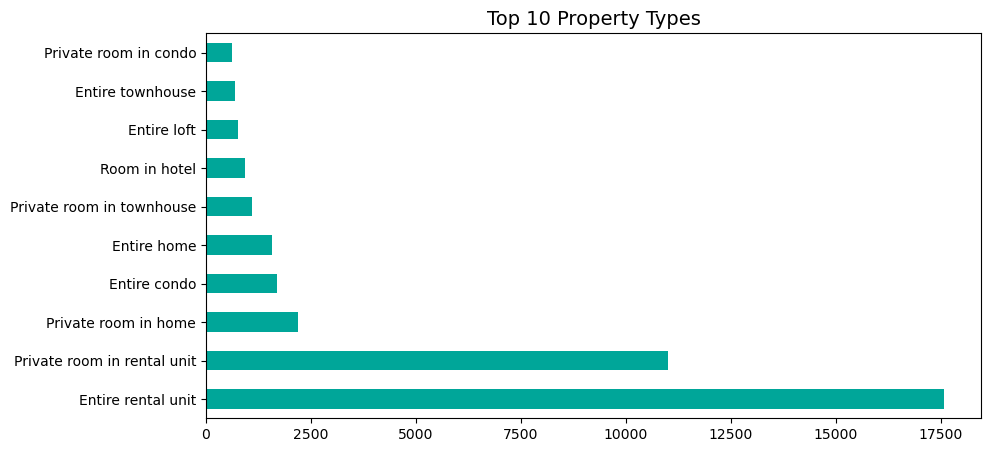

In [31]:
listtype = airbnb['property_type'].value_counts().sort_values(ascending=False)[:10]
listtype.plot.barh(figsize =(10,5), color=('#00A699'))

plt.title("Top 10 Property Types", fontsize=14)
plt.show()

In [84]:
# creating pivot table
price = pd.pivot_table(airbnb, values=['price'], columns=['room_type'], index=['property_type'], aggfunc=('mean'))
prices=round((price),2)

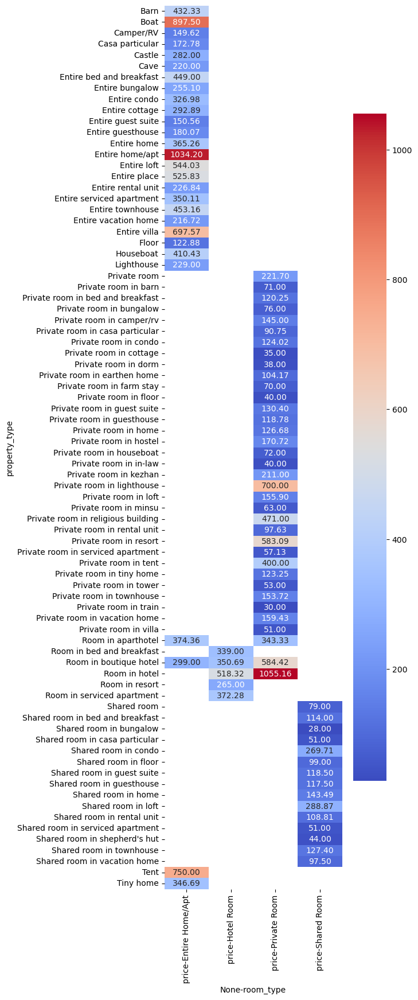

In [156]:
fig, ax = plt.subplots(figsize=(5, 20)) 
ax = sns.heatmap(prices, annot=True, fmt='.2f', cmap="coolwarm")

In [85]:
#stacked = airbnb.pivot_table('id', ['neighbourhood_group_cleansed'],  columns=['room_type'], aggfunc = ('count')).plot.bar(figsize=(5, 5), width=0.8, edgecolor='white', color=['#767676','#FF5A5F','#FC642D','#FF5A5F','#00A699']) 

In [245]:
dist = airbnb.pivot_table('price', 'neighbourhood_group_cleansed',columns='room_type', aggfunc=('count'))
dist

room_type,Entire Home/Apt,Hotel Room,Private Room,Shared Room
neighbourhood_group_cleansed,,,,
Bronx,717.0,1.0,827.0,42.0
Brooklyn,8676.0,9.0,6838.0,165.0
Manhattan,10969.0,170.0,5981.0,214.0
Queens,2925.0,8.0,3478.0,108.0
Staten Island,239.0,NaN,163.0,3.0


Text(0, 0.5, 'Count')

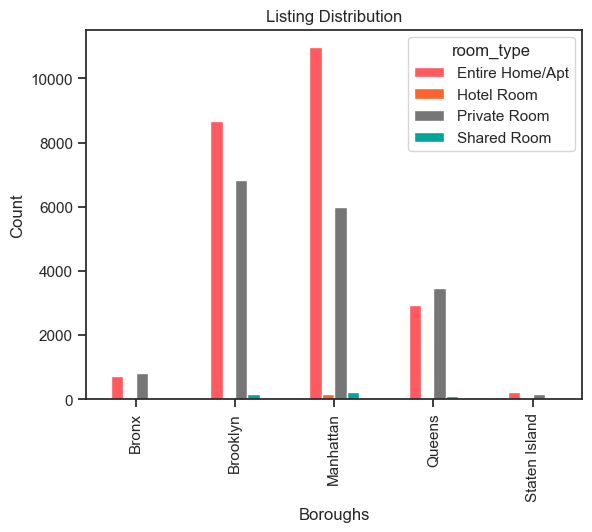

In [249]:
dist.plot.bar(color=['#FF5A5F','#FC642D','#767676','#00A699','#FF5A5F'])
plt.title('Listing Distribution')
plt.xlabel('Boroughs')
plt.ylabel('Count')

### Pivot tables

* Average Price Stacked Bar

<AxesSubplot:>

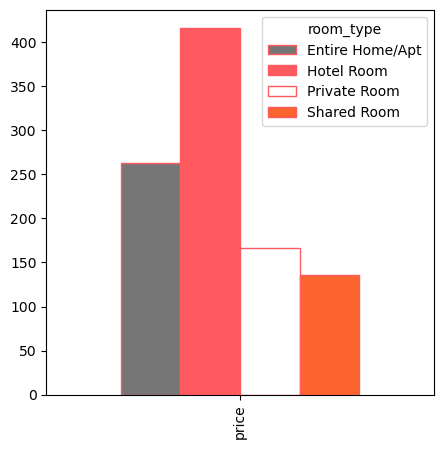

In [71]:
m = pd.pivot_table(airbnb, values=['price'], columns=['room_type'], aggfunc=('mean'))

m.plot.bar(figsize=(5, 5), width=0.8, edgecolor='#FF5A5F', color=['#767676','#FF5A5F','white','#FC642D','#00A699']) 


In [73]:
mo = pd.DataFrame(airbnb, columns = ['price','room_type','neighbourhood_group_cleansed'])
mo.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41533 entries, 0 to 41532
Data columns (total 3 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   price                         41533 non-null  float64
 1   room_type                     41533 non-null  object 
 2   neighbourhood_group_cleansed  41533 non-null  object 
dtypes: float64(1), object(2)
memory usage: 973.6+ KB


In [53]:
price = pd.pivot_table(airbnb, values=['price'], columns=['room_type'], index=['neighbourhood_group_cleansed'], aggfunc=('mean'))
prices=round((price),2)

Text(0.5, 1.0, 'Average Price of Room Type per Neighborhood')

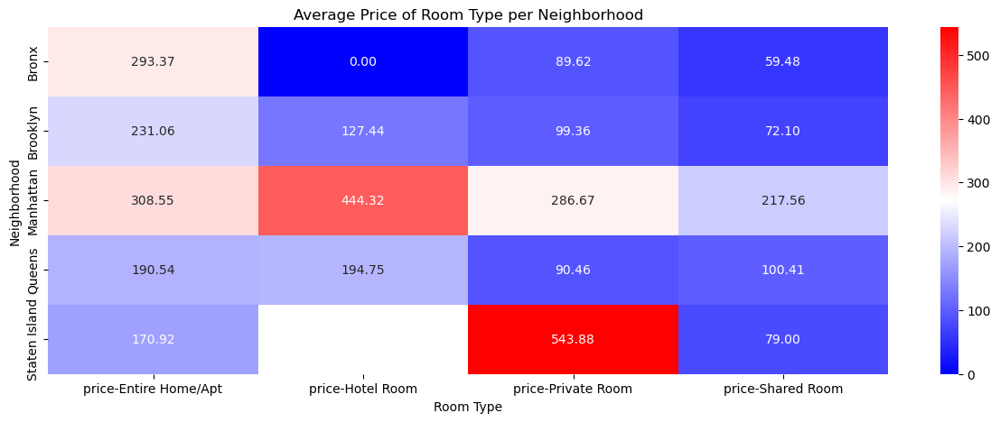

In [62]:
fig, ax = plt.subplots(figsize=(15, 5)) 
ax = sns.heatmap(prices, annot=True, fmt='.2f', cmap="bwr")
ax.set_xlabel('Room Type', fontsize=10)
ax.set_ylabel('Neighborhood', fontsize=10)
ax.set_title('Average Price of Room Type per Neighborhood')

### ratings - highest rated neighborhood in each borough
# cleanliness, location

In [74]:
airbnb.columns

Index(['id', 'description', 'host_id', 'host_name', 'host_since', 'host_about',
       'host_response_time', 'host_response_rate', 'host_acceptance_rate',
       'host_is_superhost', 'host_listings_count', 'host_total_listings_count',
       'host_verifications', 'host_has_profile_pic', 'host_identity_verified',
       'neighbourhood_cleansed', 'neighbourhood_group_cleansed', 'latitude',
       'longitude', 'property_type', 'room_type', 'accommodates',
       'bathrooms_text', 'bedrooms', 'beds', 'amenities', 'price',
       'minimum_nights', 'maximum_nights', 'minimum_minimum_nights',
       'maximum_minimum_nights', 'minimum_maximum_nights',
       'maximum_maximum_nights', 'minimum_nights_avg_ntm',
       'maximum_nights_avg_ntm', 'has_availability', 'availability_30',
       'availability_60', 'availability_90', 'availability_365',
       'calendar_last_scraped', 'number_of_reviews', 'number_of_reviews_ltm',
       'number_of_reviews_l30d', 'review_scores_rating',
       'review_sc

* Number of listings per room type

room_type
Hotel Room           188
Shared Room          532
Private Room       17287
Entire Home/Apt    23526
Name: price, dtype: int64 2


Text(0, 0.5, 'Room Type')

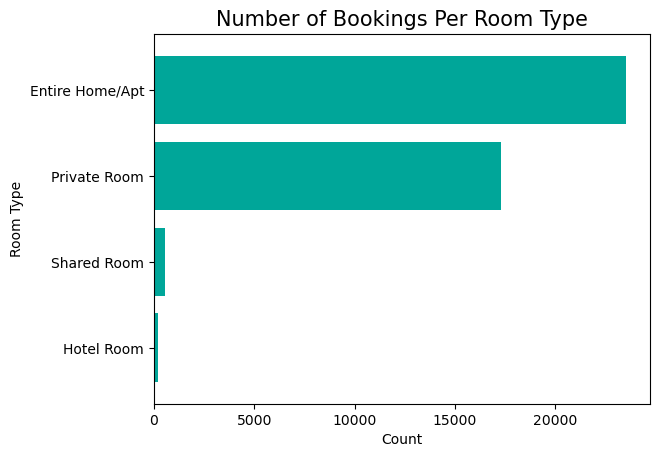

In [77]:
rt = airbnb.groupby('room_type')['price'].agg('count').nlargest(n=10).sort_values(ascending = True)
print(round(rt),2)

rt.plot(kind = 'barh', width=0.8, color = ('#00A699'))
plt.title('Number of Bookings Per Room Type', fontsize=15)
plt.xlabel('Count', fontsize=10)
plt.ylabel('Room Type', fontsize=10)

* Average Price of Room Type

room_type
Shared Room        135.0
Private Room       166.0
Entire Home/Apt    263.0
Hotel Room         416.0
Name: price, dtype: float64 2


Text(0, 0.5, 'Room Type')

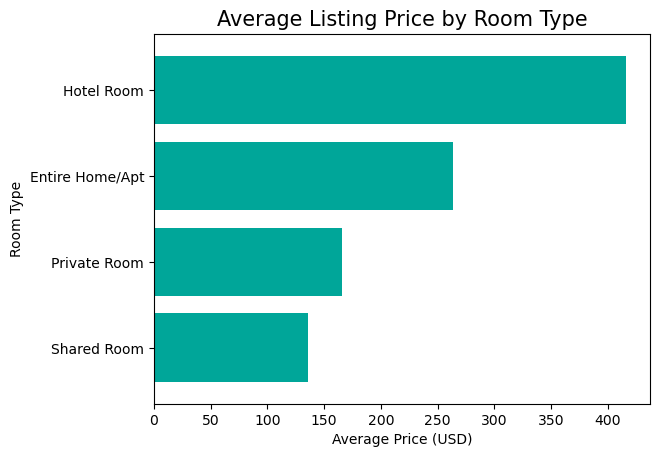

In [78]:
rtm = airbnb.groupby('room_type')['price'].agg('mean').sort_values(ascending = True)
print(round(rtm),2)

rtm.plot(kind = 'barh', width=0.8, color = ('#00A699'))
plt.title('Average Listing Price by Room Type', fontsize=15)
plt.xlabel('Average Price (USD)', fontsize=10)
plt.ylabel('Room Type', fontsize=10)

* Number of listings per property type

Text(0, 0.5, 'Property Type')

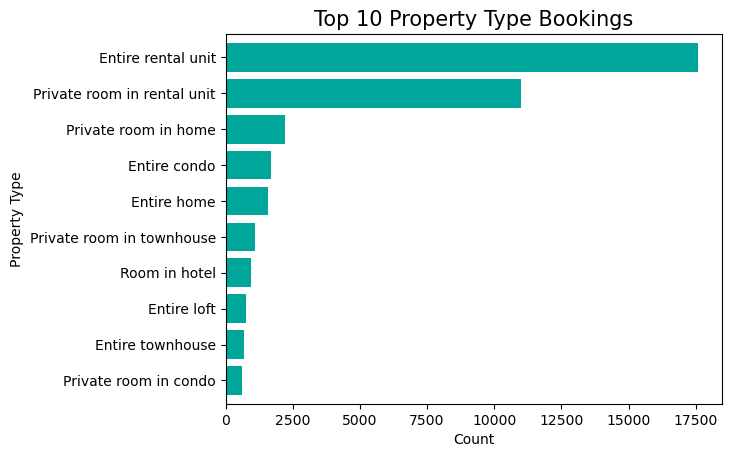

In [115]:
pt = airbnb.groupby('property_type')['price'].agg('count').nlargest(n=10).sort_values(ascending = True) #nlargest for top 10
pt

pt.plot(kind = 'barh', width=0.8, color = ('#00A699'))
plt.title('Top 10 Property Type Bookings', fontsize=15) #change to Top 10 ^
plt.xlabel('Count', fontsize=10)
plt.ylabel('Property Type', fontsize=10)

* Average Price of Room Types

Text(0, 0.5, 'Property Type')

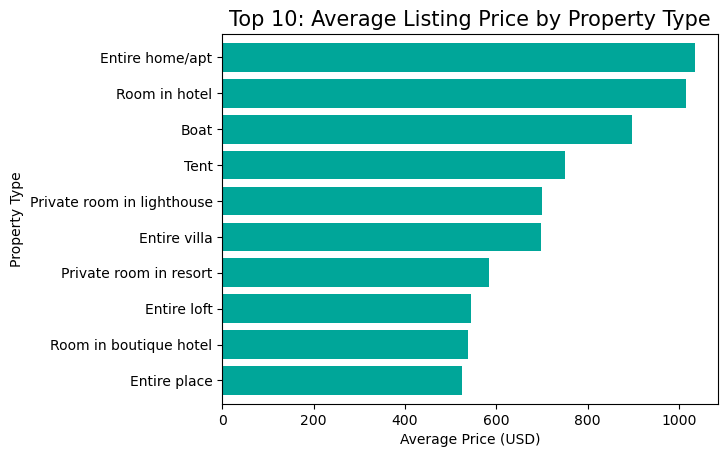

In [140]:
ptm = airbnb.groupby('property_type')['price'].agg('mean').nlargest(n=10).sort_values(ascending=True) #nsmallest for bottom 10

ptm.plot(kind = 'barh', width=0.8, color = ('#00A699'))
plt.title('Top 10: Average Listing Price by Property Type', fontsize=15)
plt.xlabel('Average Price (USD)', fontsize=10)
plt.ylabel('Property Type', fontsize=10)

 Average Ratings: all categories
* Rating based on:'review_scores_rating',
       'review_scores_accuracy', 'review_scores_cleanliness',
       'review_scores_checkin', 'review_scores_communication',
       'review_scores_location', 'review_scores_value'
* Average Rating per Neighborhood

In [86]:
revp = airbnb.groupby('neighbourhood_group_cleansed')['review_scores_rating'].agg('mean').nsmallest(n=30).sort_values(ascending=True) #nsmallest for bottom 10
print(round(revp,2))

neighbourhood_group_cleansed
Manhattan        4.59
Queens           4.64
Bronx            4.65
Brooklyn         4.67
Staten Island    4.73
Name: review_scores_rating, dtype: float64


* Average Price per Neighborhood

In [166]:
rt = airbnb.groupby('neighbourhood_group_cleansed')['price'].agg('mean').sort_values(ascending = True)
round(rt,2)

neighbourhood_group_cleansed
Queens           135.66
Brooklyn         171.93
Bronx            180.82
Manhattan        301.21
Staten Island    320.34
Name: price, dtype: float64

* Average Rating Accuracy

In [215]:
#scoresa = airbnb.groupby('neighbourhood_group_cleansed')['review_scores_accuracy'].agg('mean').sort_values(ascending=True)
scoresa = round(airbnb.groupby('neighbourhood_group_cleansed').review_scores_accuracy.mean(), 2).sort_values(ascending=False)
scoresa

neighbourhood_group_cleansed
Brooklyn         4.79
Staten Island    4.76
Bronx            4.75
Queens           4.73
Manhattan        4.72
Name: review_scores_accuracy, dtype: float64

* Average Rating Cleanliness

In [214]:
#scoresc = airbnb.groupby('neighbourhood_group_cleansed')['review_scores_cleanliness'].agg('mean').sort_values(ascending=True)
scoresc = round(airbnb.groupby('neighbourhood_group_cleansed').review_scores_cleanliness.mean(), 2).sort_values(ascending=False)
scoresc

neighbourhood_group_cleansed
Staten Island    4.73
Bronx            4.67
Brooklyn         4.66
Queens           4.64
Manhattan        4.60
Name: review_scores_cleanliness, dtype: float64

 * Average Rating Check-In

In [213]:
#scoresch = airbnb.groupby('neighbourhood_group_cleansed')['review_scores_checkin'].agg('mean').sort_values(ascending=True)
scoresch = round(airbnb.groupby('neighbourhood_group_cleansed').review_scores_checkin.mean(), 2).sort_values(ascending=False)
scoresch

neighbourhood_group_cleansed
Brooklyn         4.85
Staten Island    4.83
Queens           4.81
Bronx            4.79
Manhattan        4.79
Name: review_scores_checkin, dtype: float64

* Average Rating Communication

In [230]:
cc = round(airbnb.groupby('neighbourhood_group_cleansed').review_scores_communication.mean(), 2).sort_values(ascending=False)
cc

neighbourhood_group_cleansed
Brooklyn         4.85
Staten Island    4.85
Bronx            4.80
Manhattan        4.79
Queens           4.79
Name: review_scores_communication, dtype: float64

* Average Rating Location

In [212]:
#l = airbnb.groupby('neighbourhood_group_cleansed')['review_scores_location'].agg('mean').sort_values(ascending=True)
l = round(airbnb.groupby('neighbourhood_group_cleansed').review_scores_location.mean(), 2).sort_values(ascending=False)
l

neighbourhood_group_cleansed
Manhattan        4.80
Staten Island    4.72
Brooklyn         4.71
Queens           4.70
Bronx            4.58
Name: review_scores_location, dtype: float64

* Average Rating Value

In [209]:
#v = airbnb.groupby('neighbourhood_group_cleansed')['review_scores_value'].agg('mean').sort_values(ascending=True)
#v
r = round(airbnb.groupby('neighbourhood_group_cleansed').review_scores_value.mean(), 2).sort_values(ascending=False)
r

neighbourhood_group_cleansed
Staten Island    4.71
Brooklyn         4.70
Bronx            4.67
Queens           4.64
Manhattan        4.60
Name: review_scores_value, dtype: float64

In [89]:
#import geopandas as gpd
#vis= gpd.read_file('neighbourhoods.airbnb.geojson')

In [90]:
import plotly.express as px

# <span style='background:#767676;color:white;font-family:Courier New' > Visualizations </span>
* Room Types & Price (as seen on the slides)

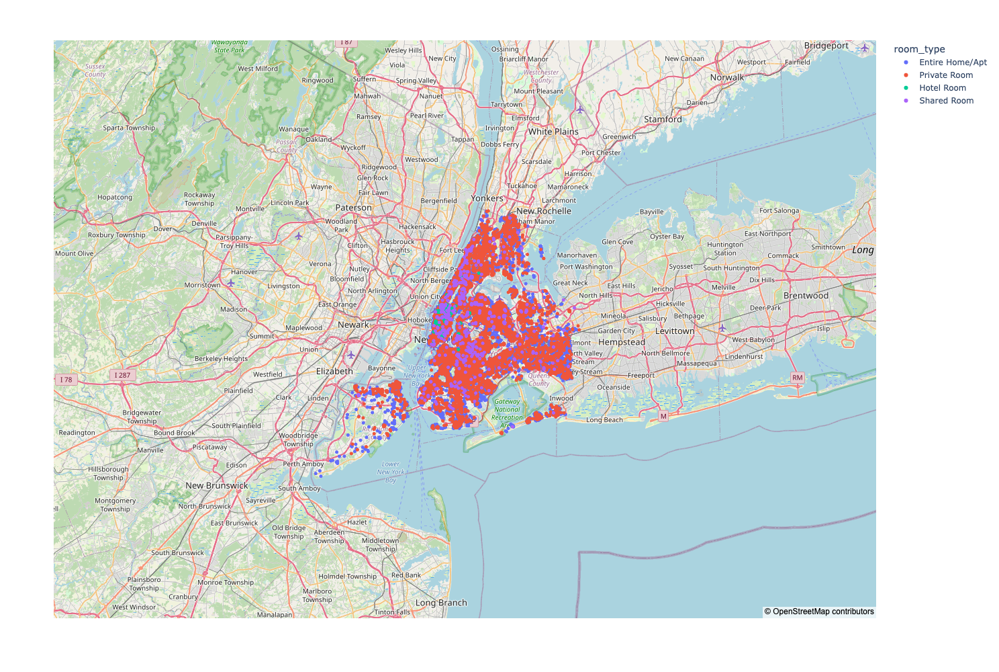

In [99]:
color_scale = [(0, 'orange'), (1,'red')]
fig = px.scatter_mapbox(airbnb,
                        lat="latitude",
                        lon="longitude",
                        hover_data=["price","room_type"],
                        color="room_type",
                        color_continuous_scale=color_scale,
                        zoom=9,
                        height=1000,
                        width=1000)
fig.update_layout(mapbox_style="open-street-map")
fig.show()

* Bookings with low cleanliness scores (less than 2.99)

In [94]:
highestrated = airbnb[airbnb['review_scores_rating']<2.99]
highestrated.head(1)

,id,description,host_id,host_name,host_since,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,...,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
213,201514,You stay in a lovely historical building from ...,985846,Tere,2011-08-17,I am the owner of this beautifully restored la...,NaN,NaN,NaN,f,...,NaN,NaN,NaN,NaN,f,1,1,0,0,0.02


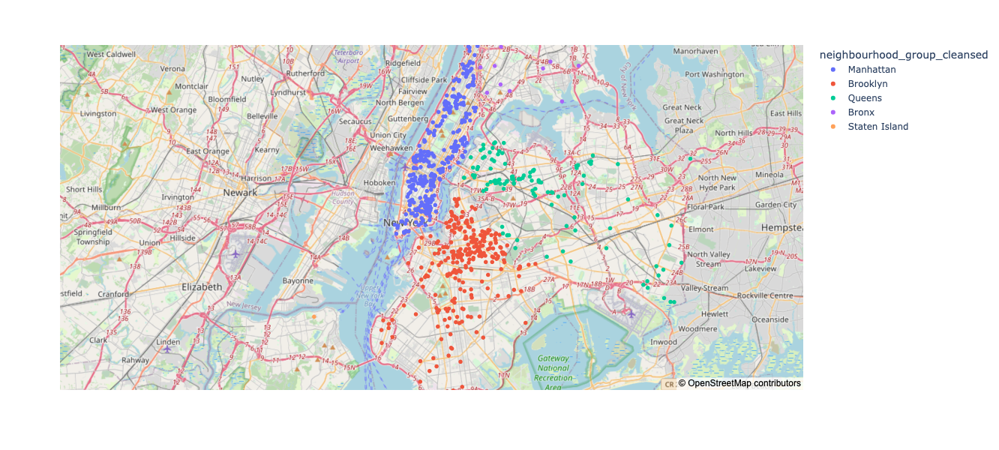

In [70]:
color_scale = [(0, 'orange'), (1,'red')]
fig = px.scatter_mapbox(highestrated,
                        lat="latitude",
                        lon="longitude",
                        hover_data=["price","review_scores_cleanliness"],
                        color="neighbourhood_group_cleansed",
                        color_continuous_scale=color_scale,
                        zoom=9,
                        height=600,
                        width=1000)
fig.update_layout(mapbox_style="open-street-map")
fig.show()

* Bookings with high score ratings

In [122]:
hr = airbnb[airbnb['review_scores_location']<1.99]
hr.head(5)

,id,description,host_id,host_name,host_since,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,...,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
1327,1273533,Large three bedroom/one bathroom apartment wit...,2246253,Nerenda,2012-04-29,I'm a commercial producer living and working i...,NaN,NaN,NaN,f,...,5.0,5.0,1.0,2.0,f,1,0,1,0,0.02
3558,5191617,"This comfortable room has high ceilings, big w...",3977023,Vaida,2012-10-25,I study Anthropology at the New School. I am o...,NaN,NaN,NaN,f,...,0.0,0.0,0.0,0.0,t,2,0,2,0,0.01
4555,6989258,"Clean, safe and cozy 1 bedroom apartment in e...",7339760,Maritza,2013-07-07,Greetings. I hope that you will find my listin...,NaN,NaN,NaN,f,...,0.0,0.0,0.0,0.0,f,1,1,0,0,0.01
4830,7433174,Townhouse in private community with night Serc...,34789416,Carl,2015-06-01,Theatre Manager for a Community based Theatre....,NaN,NaN,NaN,f,...,1.0,1.0,1.0,1.0,f,1,0,1,0,0.02
5534,8636811,Amazing bedroom in a cosy appartment South Wes...,45329725,Alexis,2015-09-29,NaN,NaN,NaN,NaN,f,...,5.0,5.0,0.0,5.0,f,1,0,1,0,0.01


In [117]:
#airbnb.columns

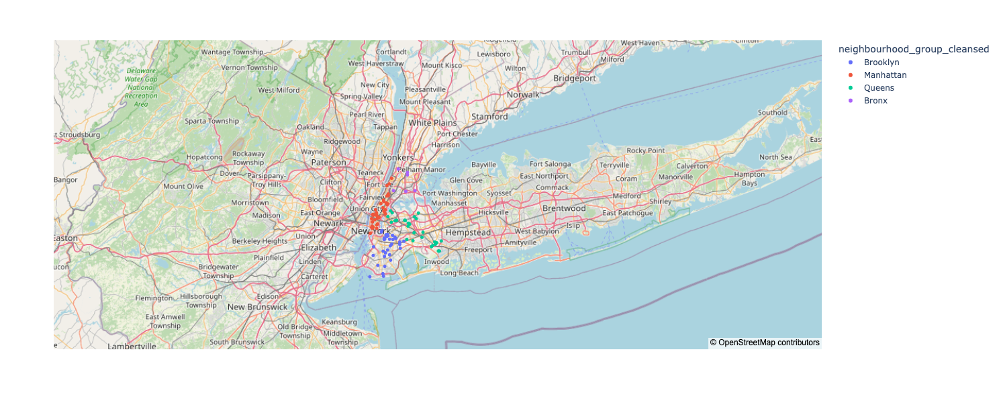

In [123]:
color_scale = [(0, 'orange'), (1,'red')]
fig = px.scatter_mapbox(hr,
                        lat="latitude",
                        lon="longitude",
                        hover_data=["price","review_scores_location"],
                        color="neighbourhood_group_cleansed",
                        color_continuous_scale=color_scale,
                        zoom=9,
                        height=600,
                        width=1000)
fig.update_layout(mapbox_style="open-street-map")
fig.show()

 > <span style='background:#00A699;color:white;font-family:Courier New' > Thanks for watching!  </span>